# Kaggle Timeseries Dataset

Based on HMI SHARP data.

Download data from the Kaggle challenge page (https://www.kaggle.com/c/bigdata2019-flare-prediction/data) and put it to the folder specified with `DATADIR`.

The data come with three different folds that will allow for performing 3-fold cross validation. The folds are constructed such that they should not be mixed.

In [1]:
DATADIR = "/Users/martinm/astroml/rodem_workshop/KaggleTimeseriesData/input"

FILENAMES = ['fold3Training.json',] # ['fold1Training.json', 'fold2Training.json', 'fold3Training.json']

The data included in the files are provided in a json-format - actually, each line contains a json dict. We use the `json` package to load and decode the data. The json dict is structured as follows:
* at the uppermost level we see the samples, with a unique `id`, a label value (`classNum`) and the `values`
* as `values` we see in the next level the different features - again a dictionary with the feature names as keys.
* at the lowest level, we per feature the values per timestep - again specified as a dict with the timesteps (enumerated from 0-59) as keys.

#### Features

| Feature | Description |
|---------|-------------|
| TOTFX, TOTFY, TOTFZ, TOTBSQ | Lorenzforce components and total magnitude |
| EPSX, EPSY, EPSZ | Normalized Lorentzforce components |
| TOTPOT, MEANPOT | Photospheric magnetic energy density (total and mean excess) |
| MEANGAM | Mean inclination angle of magnetic field |
| MEANSHR, SHRGT45 | Mean shear angle, area with shear angle greater than 45 degrees |
| MEANGBH, MEANGBZ, MEANGBT| Field gradient (horizontal, vertical, total magnitude) |
| USFLUX | Total unsigned flux |
| R_VALUE | Total unsigned flux around high gradient polarity inversion lines using the $B_{\rm los}$ component |
| TOTUSJH, TOTUSJZ| Unsigned helicity and vertical component of current | 
| MEANJZH, MEANJZD | Current (helicity, vertical density) |
| ABSNJZH | Abs net current helicity |
| SAVNCPP | Abs net current per polarity |
| MEANALP | Mean twist parameter |
| XR_MAX | TBD |

The following code is based on the Jupyter notebook obtained from the Kaggle challenge page: https://www.kaggle.com/c/bigdata2019-flare-prediction/code. For further information on the data, see also the page from the creator of the dataset: https://dmlab.cs.gsu.edu/bigdata/flare-comp-2019/Data.html 

With the `load_data`-function, you can load the data from a json file into a 
* nested dictionary with 
    * at first level: sample id as key and dictionary with per sample values as value
    * at nested level: feature name as key and numpy array with the feature values per time step as value
* list of features loaded
* dictionary with the sample id as key and the label `(0,1)` as value.

You can also specify 
* the number of timesteps to be loaded (counting from the end of the sequences) 
* the features to be loaded (listed by feature name provided in the table above) - use `None` to load them all.  

### Functionality to Load Data

In [2]:
from json import JSONDecoder, JSONDecodeError  # for reading the JSON data files
import numpy as np 
import os
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import re

In [3]:
def decode_obj(line, pos=0, decoder=JSONDecoder()):
    no_white_space_regex = re.compile(r'[^\s]')
    while True:
        match = no_white_space_regex.search(line, pos)
        if not match:
            return
        pos = match.start()
        try:
            obj, pos = decoder.raw_decode(line, pos)
        except JSONDecodeError as err:
            print('Oops! something went wrong. Error: {}'.format(err))
        yield obj
        

def parse_line(line, timesteps, features=None):
    obj = next(decode_obj(line))
    label = obj['classNum']
    del obj['id']
    del obj['classNum']
    
    values = obj['values']
    if not features:
        features = [k for k in values.keys()]
    
    nfeatures = len(features)
    nsteps = len(timesteps)
    data = []
    for feature in features:
        perstep = values[feature]
        data.append([perstep[step] for step in timesteps])
    
    return data, features, label


def load_data(filepath, nsteps=-1, features=None):
    """
    Parses the json file line by line into an array of samples.
    :param filepath: the path to file the data should be loaded from
    :param steps: number of time steps to consider (counted from the end of the sequence); all (i.e. 60) if set to -1
    :param features: the features to be considered, all if set to None
    :return: data as dict (per sample id), features as list, labels as dict (per sample id)
    """
    
    if nsteps <= 0:
        steps = np.arange(0, 60)
    else:
        steps = np.arange(0, 60)[-nsteps:]
    timesteps = [str(step) for step in steps]
    
    data, labels = [], []
    with open(filepath, 'r') as infile: # Open the file for reading
        for line in infile:  # Each 'line' is one MVTS with its single label (0 or 1).
            data0, features, label = parse_line(line, timesteps, features)
            data.append(data0)
            labels.append(label)    
            
    return np.array(data), features, np.array(labels)

In [4]:
ALL_FEATURES = ('TOTFX', 'TOTFY', 'TOTFZ', 'TOTBSQ', 'EPSX', 'EPSY', 'EPSZ', 'TOTPOT', 'MEANPOT', 'MEANGAM', 'MEANSHR', 'SHRGT45', \
                'MEANGBH', 'MEANGBZ', 'MEANGBT', 'USFLUX', 'R_VALUE', 'TOTUSJH', 'TOTUSJZ', 'MEANJZH', 'MEANJZD', 'ABSNJZH', 'SAVNCPP', \
                'MEANALP', 'XR_MAX')

### Load Data - One of the Folds

In [5]:
file_index = 0
nsteps = 60
features = ALL_FEATURES

In [6]:
filepath = os.path.join(DATADIR, FILENAMES[file_index])
data, features, labels = load_data(filepath, nsteps=nsteps, features=features)

#### Some first inspection

In [7]:
data[1,0,0:6]

array([1.00990599e+24, 1.02597856e+24, 1.03057429e+24, 1.02447326e+24,
       1.02804992e+24, 1.02797887e+24])

In [8]:
print("Loaded features: %s"%', '.join(features))
print("Label values:    %s"%', '.join([str(l) for l in set(labels)]))
print("Sample Sequence: %s..."%', '.join([str(v) for v in data[1,0,0:4]])) # sequence data

Loaded features: TOTFX, TOTFY, TOTFZ, TOTBSQ, EPSX, EPSY, EPSZ, TOTPOT, MEANPOT, MEANGAM, MEANSHR, SHRGT45, MEANGBH, MEANGBZ, MEANGBT, USFLUX, R_VALUE, TOTUSJH, TOTUSJZ, MEANJZH, MEANJZD, ABSNJZH, SAVNCPP, MEANALP, XR_MAX
Label values:    0, 1
Sample Sequence: 1.0099059881288988e+24, 1.025978564712161e+24, 1.0305742878386716e+24, 1.0244732573344916e+24...


### Some closer look into the data

In [9]:
import matplotlib.pyplot as plt

#### Sequence Data

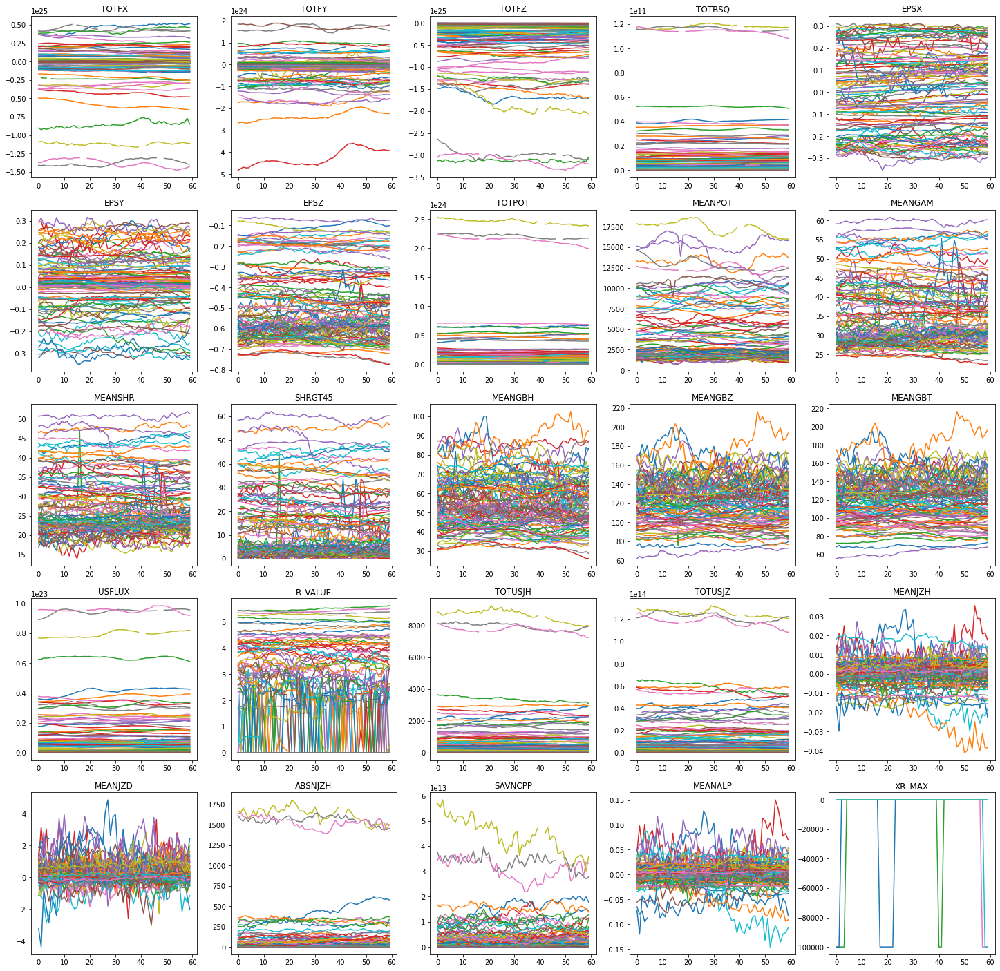

In [10]:
nkeys = 100
t = np.arange(60)

plt.figure( figsize=(25,25) )
for i in range(5):
    for j in range(5):
        plt.subplot( 5, 5, 5*i+j+1 )
        feature = features[5*i+j]
        plt.title(feature )
        for k in range(nkeys):
            y = data[k,5*i+j]
            plt.plot(t, y)
        #plt.axis('off')

#### Some Statistics

In [11]:
def mean(x):
    return np.nanmean(x) 

def stdev(x):
    return np.nanstd(x) 

def slope(x):
    try:
        t = np.array(range(60))
        m,b = np.polyfit(t, x, 1)
        return m
    except:
        return np.nan
        
def get_stats_as_df(data, labels, features, statsfun):
    nsamples, nfeatures, nsteps = data.shape
    stats = np.zeros((nsamples, (nfeatures+1)), dtype='float')
    for i in range(nsamples):
        for f in range(nfeatures):
            stats[i,f] = statsfun(data[i,f,:])
        stats[i,nfeatures] = labels[i]
    cols = [f for f in features]
    cols.append("LABEL")
    return pd.DataFrame(np.array(stats), columns=cols)

In [12]:
stats_mean = get_stats_as_df(data, labels, features, mean)

In [13]:
stats_mean.head()

,TOTFX,TOTFY,TOTFZ,TOTBSQ,EPSX,EPSY,EPSZ,TOTPOT,MEANPOT,MEANGAM,...,R_VALUE,TOTUSJH,TOTUSJZ,MEANJZH,MEANJZD,ABSNJZH,SAVNCPP,MEANALP,XR_MAX,LABEL
0,4.576541e+24,-9.471859e+23,-1.671105e+25,4.030603e+10,-0.085318,0.017698,-0.311959,6.493675e+23,8392.368747,39.412728,...,4.983752,2059.720430,3.767045e+13,0.004898,0.007592,285.196155,1.079107e+13,0.010795,1.166798e-06,1.0
1,9.812632e+23,5.625625e+22,-2.825775e+24,2.983143e+09,-0.247599,-0.014267,-0.713304,1.841892e+22,1377.462133,24.937559,...,1.686258,341.489261,7.824279e+12,0.006973,-0.365758,69.716388,4.034209e+12,0.027376,5.365658e-06,0.0
2,2.053169e+23,-1.435152e+23,-4.796763e+23,6.367440e+08,-0.242643,0.170275,-0.567959,5.444903e+21,2046.658537,31.384151,...,0.000000,82.784670,1.968152e+12,0.003168,0.493660,6.425703,5.370631e+11,0.012835,1.185401e-06,0.0
3,8.432018e+22,-2.012278e+23,-8.911281e+23,2.235033e+09,-0.028505,0.067788,-0.300148,2.654274e+22,5922.581918,51.091333,...,0.030603,197.386617,3.770364e+12,-0.002130,0.167767,7.293034,4.412923e+11,-0.004929,6.062833e-07,0.0
4,-4.183596e+22,-8.724456e+22,-2.393149e+23,3.881255e+08,0.080969,0.169555,-0.464110,2.514428e+21,2044.413447,40.422489,...,1.550629,58.454196,1.167794e+12,0.007430,0.037509,6.945961,3.969685e+11,0.024177,1.058575e-06,0.0


#### custom plots: histogram, scatter matrix

In [14]:
def histograms(df, features):
    flare = df[df['LABEL']==1]
    noflare = df[df['LABEL']==0]
    m = len(features)
    ncols = 6
    nrows = m//6+1
    plt.figure( figsize=(25,25) )
    row = 0
    col = 1
    for f in features:
        x1 = noflare[f]
        x2 = flare[f]
        plt.subplot(nrows,ncols,row*ncols+col)
        plt.hist([x1,x2], bins=50, histtype='barstacked', stacked=True, log=True, color=['blue','red'])
        plt.title(f)
        col += 1
        if col > ncols:
            col = 1            
            row += 1
    plt.show()        

In [15]:
def scatter_matrix(df, features):
    flare = df[df['LABEL']==1]
    noflare = df[df['LABEL']==0]
    m = len(features)
    cols = features
    rows = features
    figsize = (m*3,m*3) 
    fig, axes = plt.subplots(nrows=m, ncols=m, figsize=figsize)

    for ax, colname in zip(axes[0], cols):
        ax.set_title(colname)

    for ax, rowname in zip(axes[:,0], rows):
        ax.set_ylabel(rowname, rotation=90, size='large')
    
    plt.figure( figsize=(30,30) )
    row = 0
    col = 0
    for f1 in features:
        x1 = noflare[f1]
        x2 = flare[f1]
        for f2 in features:
            if f1==f2:
                axes[row,col].hist([x1,x2], bins=50, histtype='barstacked', stacked=True, log=True, color=['blue','red'])
            else:
                y1 = noflare[f2]
                y2 = flare[f2]
                axes[row,col].plot(x1,y1,'bo',ms=1)
                axes[row,col].plot(x2,y2,'ro',ms=1)
            col += 1
        col = 0
        row += 1
    fig.tight_layout()
    plt.show()    

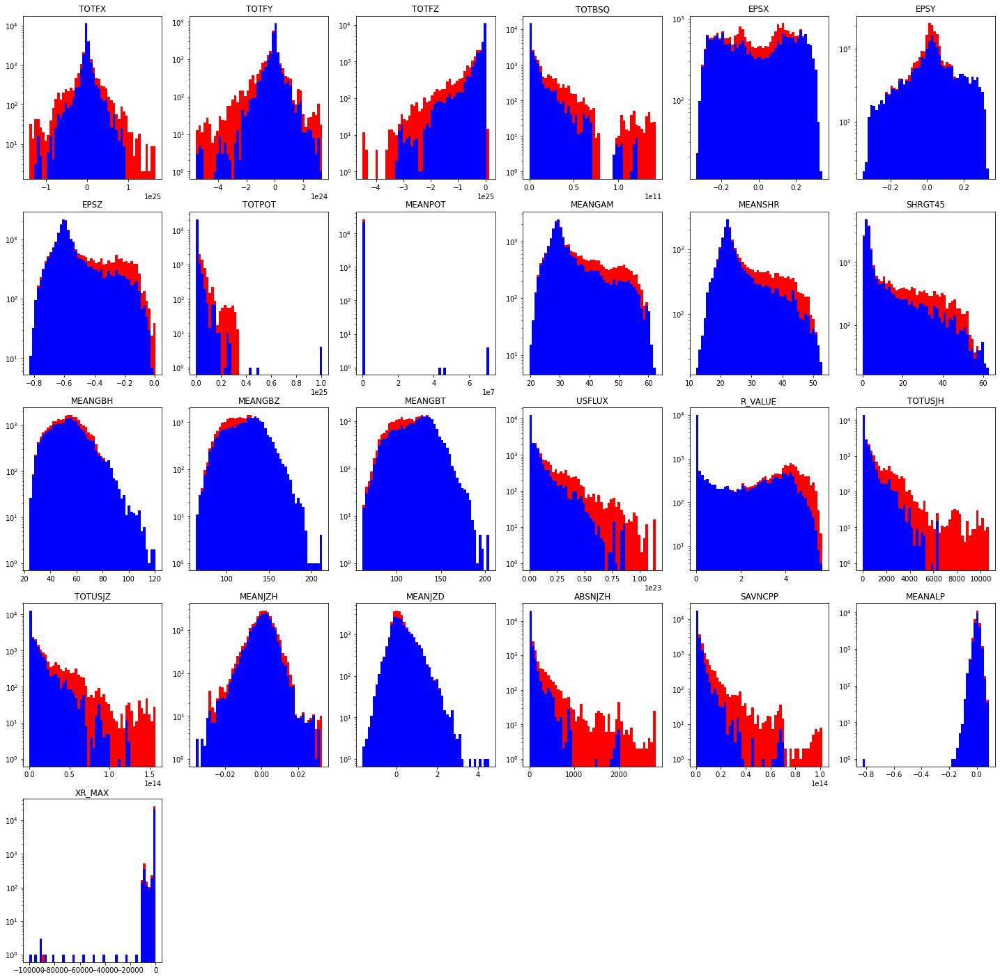

In [16]:
histograms(stats_mean, features=ALL_FEATURES)

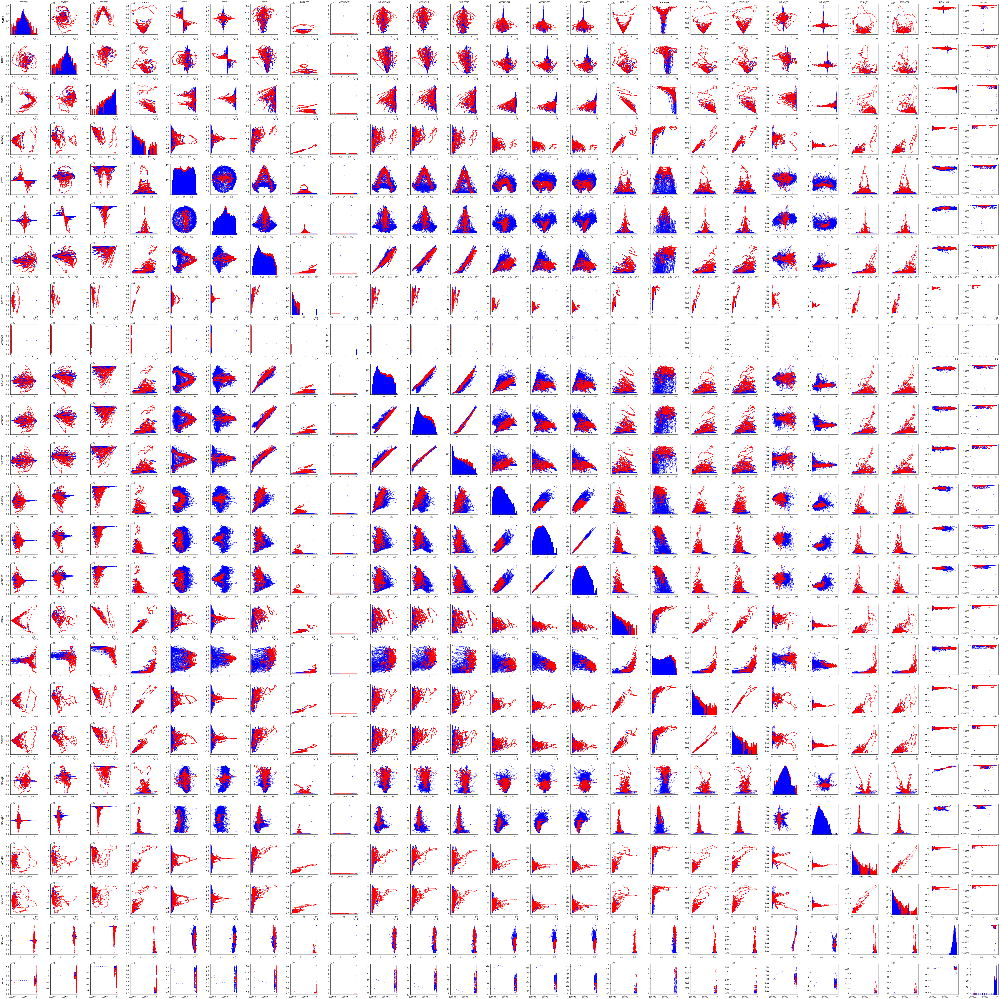

<Figure size 2160x2160 with 0 Axes>

In [17]:
scatter_matrix(stats_mean, features=ALL_FEATURES)#['TOTFX','TOTFY','TOTFZ'])

## Some Preprocessing

#### Eliminate NaNs

There are NaNs as the following examples shows:

In [18]:
print(np.sum(np.isnan(data))>0)

True


In [19]:
def interpolate_nans(sequence):    
    nans = np.isnan(sequence)
    hasnans = np.sum(nans)>0
    nan_indices = nans.nonzero()[0]
    nonan_indices = (~nans).nonzero()[0]
    sequence[nans]= np.interp(nan_indices, nonan_indices, sequence[~nans])
    
def eliminate_nans(data, features):
    for k in range(data.shape[0]):
        for f in range(data.shape[1]):
            interpolate_nans(data[k,f])


In [20]:
eliminate_nans(data, features)

In [21]:
print(np.sum(np.isnan(data))>0)

False


#### Split train - validate

In [22]:
features  = ALL_FEATURES
nfeatures = len(features)
nsamples = data.shape[0]
sampleids = np.arange(nsamples)
np.random.shuffle(sampleids)
ntrain    = 2 * nsamples // 3
nval      = nsamples-ntrain
trainids  = sampleids[0:ntrain]
valids  = sampleids[ntrain:]

trainset  = np.transpose(data[trainids].astype(np.float32), (0,2,1))
valset    = np.transpose(data[valids].astype(np.float32),(0,2,1))
trainlabels = labels[trainids].reshape(ntrain,1).astype(np.float32)
vallabels = labels[valids].reshape(nval,1).astype(np.float32)

print(trainset.shape, valset.shape, trainlabels.shape, vallabels.shape)

(18004, 60, 25) (9002, 60, 25) (18004, 1) (9002, 1)


#### Normalizing Features

In [23]:
def center_scale(data, center=None, scale=None):
    if not center:
        center = np.median(data)
    if not scale:
        scale = np.quantile(data, 0.75)-np.quantile(data, 0.25)
    data = (data-center)/scale
    return data, center, scale

def min_max(data, minimum=None, maximum=None):
    if not minimum:
        minimum = data.min()
    if not maximum:
        maximum = data.max()
    data = (data-minimum) / (maximum-minimum)
    return data, minimum, maximum

In [24]:
SCALING_METHODS = {
'TOTFX':(center_scale, None, None),
'TOTFY':(center_scale, None, None),
'TOTFZ':(center_scale, 0, None),
'TOTBSQ':(center_scale, 0, None),
'EPSX':(center_scale, None, None),
'EPSY':(center_scale, None, None),
'EPSZ':(center_scale, 0, None),
'TOTPOT':(center_scale, 0, None),
'MEANPOT':(center_scale, 0, None),
'MEANGAM':(min_max,0,90),
'MEANSHR':(min_max,0,90),
'SHRGT45':(min_max,0,90),
'MEANGBH':(center_scale, None, None),
'MEANGBZ':(center_scale, None, None),
'MEANGBT':(center_scale, None, None),
'USFLUX':(center_scale, 0, None),
'R_VALUE':(center_scale, 0, None),
'TOTUSJH':(center_scale, 0, None),
'TOTUSJZ':(center_scale, 0, None),
'MEANJZH':(center_scale, None, None),
'MEANJZD':(center_scale, None, None),
'ABSNJZH':(center_scale, 0, None),
'SAVNCPP':(min_max,0,1),
'MEANALP':(center_scale, None, None),
'XR_MAX':(center_scale, 0, None)}

In [25]:
def normalize_data(data, features, methods):
    norm_parameters = {}
    for i in range(len(features)):
        arr = data[:,:,i]
        method = methods[features[i]]
        fun = method[0]
        par1 = method[1]
        par2 = method[2]
        data[:,:,i], par1, par2 = fun(arr, par1, par2)
        norm_parameters[features[i]] = (fun, par1, par2)
    return norm_parameters

In [26]:
applied_scaling_train = normalize_data(trainset, features, SCALING_METHODS)

In [28]:
_ = normalize_data(valset, features, applied_scaling_train)

In [29]:
meantrain = pd.DataFrame(np.mean(trainset, axis=1), columns=features)
meantrain['LABEL'] = trainlabels
meanval = pd.DataFrame(np.mean(valset, axis=1), columns=features)
meanval['LABEL'] = vallabels

In [30]:
meantrain.head()

,TOTFX,TOTFY,TOTFZ,TOTBSQ,EPSX,EPSY,EPSZ,TOTPOT,MEANPOT,MEANGAM,...,R_VALUE,TOTUSJH,TOTUSJZ,MEANJZH,MEANJZD,ABSNJZH,SAVNCPP,MEANALP,XR_MAX,LABEL
0,-1.387024,-4.945007,-0.869478,2.417634,0.059265,0.168527,1.506415,3.324207,1.995171,0.581820,...,0.485489,2.033369,1.997849,-0.451768,0.029787,1.231350,3.437051e+12,-0.360367,-0.203227,1.0
1,-0.013625,-0.009416,0.245745,-0.162563,0.196373,1.482506,-0.036161,-0.090308,-0.188773,0.251836,...,-0.485823,-0.204444,-0.204753,-1.163736,1.756447,-0.132953,2.523242e+11,-1.337778,-0.336331,0.0
2,7.884838,5.568193,-3.559158,2.856442,-0.449201,-0.506184,0.563799,2.761470,0.585596,0.322605,...,0.613623,2.678176,2.797165,0.168562,-0.411440,2.003011,1.150060e+13,0.152398,0.365090,0.0
3,0.066312,0.234519,0.245700,-0.162988,-0.806290,-1.902900,-0.097743,-0.086154,-0.042526,0.232515,...,-0.485823,-0.205875,-0.201763,-0.769486,0.812992,-0.145643,1.686773e+11,-1.122900,1.353557,0.0
4,8.847311,5.432925,-3.638865,4.340450,-0.345413,-0.394616,1.018550,5.415967,1.658470,0.366823,...,0.703593,2.698636,2.624783,-0.069557,-0.421659,0.369447,3.827569e+12,-0.086310,-0.086923,1.0


In [31]:
meantrain['LABEL'].sum()/meantrain.size

0.00668654828841454

In [32]:
meanval.head()

,TOTFX,TOTFY,TOTFZ,TOTBSQ,EPSX,EPSY,EPSZ,TOTPOT,MEANPOT,MEANGAM,...,R_VALUE,TOTUSJH,TOTUSJZ,MEANJZH,MEANJZD,ABSNJZH,SAVNCPP,MEANALP,XR_MAX,LABEL
0,1.462226,1.780841,-0.373728,0.236500,-0.601838,-0.911755,0.220044,0.186822,0.334917,0.307417,...,0.362553,0.389525,0.339395,1.706106,0.342671,1.636865,5.645607e+12,1.404222,-0.282858,1.0
1,8.368933,-7.979220,-2.807006,13.438325,-0.127355,-0.075417,1.751768,21.499723,3.360497,0.551556,...,0.784207,9.129332,8.650936,1.803190,0.061936,32.039116,6.944075e+13,1.022856,0.253025,1.0
2,-1.384722,-0.174009,-0.567015,0.282097,0.466072,-0.068429,-0.080659,0.168832,0.237241,0.227010,...,0.527973,0.132747,0.079239,-0.225445,-0.633243,-0.056138,1.016540e+12,-0.201492,19.978128,0.0
3,0.138055,0.310491,0.210465,-0.145904,-0.753525,-1.377894,-0.243542,-0.078990,-0.029358,0.231093,...,-0.485823,-0.185850,-0.185269,-0.005085,-0.790543,-0.167211,1.425907e+11,-0.002316,0.854732,0.0
4,0.006725,0.077752,0.263857,-0.172941,-0.171135,1.976969,-0.192769,-0.094017,-0.214722,0.214370,...,-0.485823,-0.225020,-0.224487,0.623103,1.674425,-0.173427,6.573671e+10,0.940408,1.638210,0.0


In [33]:
meanval['LABEL'].sum()/meanval.size

0.0070069898996804126

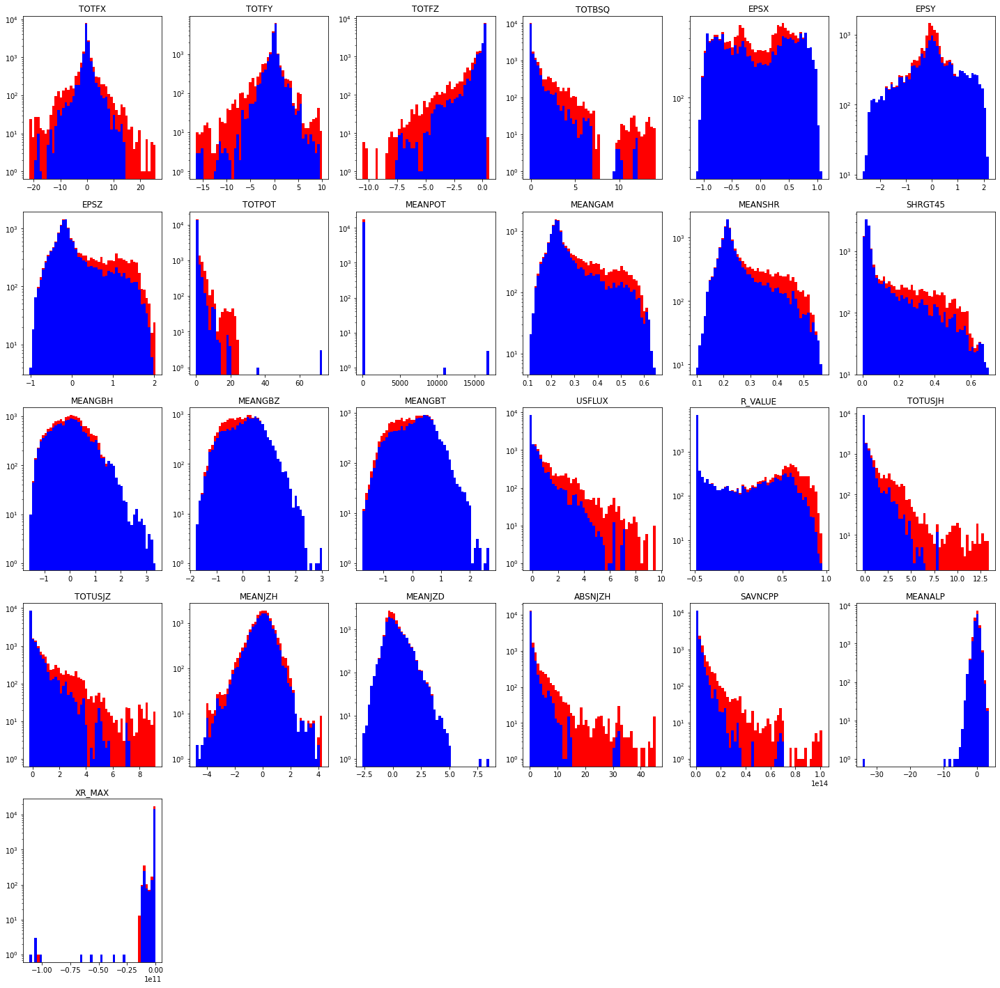

In [34]:
histograms(meantrain, features=ALL_FEATURES)

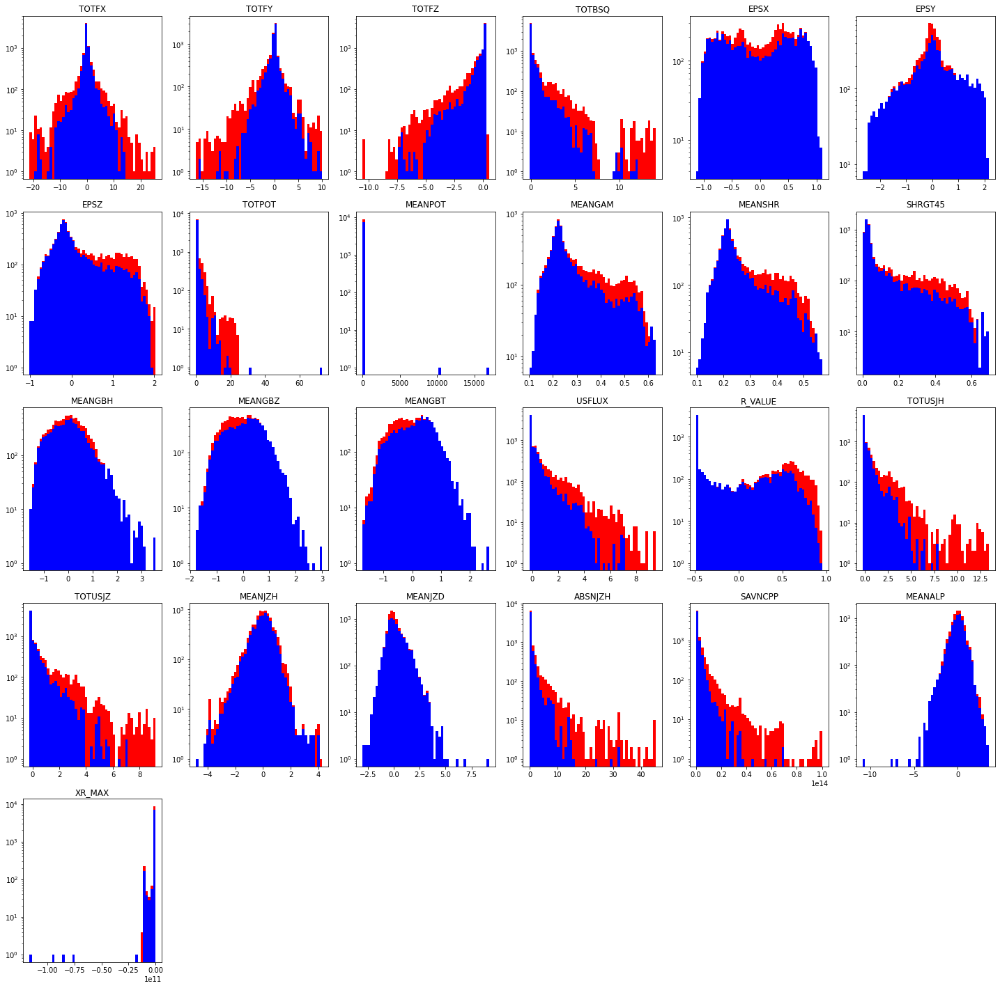

In [35]:
histograms(meanval, features=ALL_FEATURES)

## Modeling

We here only work with a single fold.
It should be easy to generalize the above to load the data from all the three folds - or better, to load the data from two fold - while using the third for validation.

As model we here consider most simply a classical machine learning model.

But let's first split the data into train and validate (only the given fold).

In [36]:
import torch
from torch.utils.data import TensorDataset, DataLoader
import torch.nn as nn

train_data = TensorDataset(torch.from_numpy(trainset), torch.from_numpy(trainlabels))
val_data = TensorDataset(torch.from_numpy(valset), torch.from_numpy(vallabels))

batch_size = 64

train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size)
val_loader = DataLoader(val_data, shuffle=True, batch_size=batch_size)

# check the output
for X, y in train_loader:
    print("Shape of X [#samples, #features, #steps]: ", X.shape)
    print("Shape of y: ", y.shape, y.dtype)
    break
for X, y in val_loader:
    print("Shape of X [#samples, #features, #steps]: ", X.shape)
    print("Shape of y: ", y.shape, y.dtype)
    break

Shape of X [#samples, #features, #steps]:  torch.Size([64, 60, 25])
Shape of y:  torch.Size([64, 1]) torch.float32
Shape of X [#samples, #features, #steps]:  torch.Size([64, 60, 25])
Shape of y:  torch.Size([64, 1]) torch.float32


In [37]:
is_cuda = torch.cuda.is_available()
if is_cuda:
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(device)

cpu


In [39]:
class LSTMClassifier(nn.Module):
    
    def __init__(self, input_dim, hidden_dim):
        super(LSTMClassifier, self).__init__()

        self.hidden_dim = hidden_dim
        self.lstm = nn.LSTM(input_dim, hidden_dim, 1, batch_first=True)
        self.classifier = nn.Sequential(
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        # Initializing hidden states (short and long term memory) for first input with zeros
        #h0 = torch.zeros(1, x.size(0), self.hidden_dim)
        #c0 = torch.zeros(1, x.size(0), self.hidden_dim)

        # Passing through the LSTM layer 
        out, _ = self.lstm(x)

        # Picking the last element of the output of the LSTM of shape (batch_size, seq_length, hidden_size) 
        out = torch.squeeze(out[:, -1, :])

        # Passing through the classification layer
        out = self.classifier(out)

        return out

In [57]:
hidden_dim = 128
model = LSTMClassifier(nfeatures, hidden_dim)
loss_fn = nn.BCELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=1e-4)

In [58]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)

        # Compute prediction error
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch % 100 == 0:
            loss, current = loss.item(), batch * len(X)
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

In [59]:
def test(dataloader, model, loss_fn, is_test=True):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, wrong = 0, 0
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            wrong += (pred.round()-y).abs().sum().item()
            #print(pred, test_loss,wrong)
            break
    test_loss /= num_batches
    wrong /= size
    if is_test:
        print(f"Test Error: {(100*wrong):>0.3f}%, Avg loss: {test_loss:>8f}")
    else:
        print(f"Train Error: {(100*wrong):>0.3f}%, Avg loss: {test_loss:>8f}")
    return test_loss, wrong

In [61]:
epochs = 50
train_loss = []
test_loss = []
train_err = []
test_err = []
for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train(train_loader, model, loss_fn, optimizer)
    loss, err = test(train_loader, model, loss_fn)
    train_loss.append(loss)
    train_err.append(err)
    loss, err = test(val_loader, model, loss_fn)
    test_loss.append(loss)
    test_err.append(err)
    print("\n")
print("Done!")

Epoch 1
-------------------------------
loss: 0.647009  [    0/18004]
loss: 0.623731  [ 6400/18004]
loss: 0.593014  [12800/18004]
Test Error: 0.067%, Avg loss: 0.002124
Test Error: 0.122%, Avg loss: 0.004200


Epoch 2
-------------------------------
loss: 0.587461  [    0/18004]
loss: 0.597347  [ 6400/18004]
loss: 0.569588  [12800/18004]
Test Error: 0.078%, Avg loss: 0.002064
Test Error: 0.178%, Avg loss: 0.004225


Epoch 3
-------------------------------
loss: 0.578083  [    0/18004]
loss: 0.523878  [ 6400/18004]
loss: 0.503360  [12800/18004]
Test Error: 0.083%, Avg loss: 0.002018
Test Error: 0.100%, Avg loss: 0.003587


Epoch 4
-------------------------------
loss: 0.537697  [    0/18004]
loss: 0.530653  [ 6400/18004]
loss: 0.524767  [12800/18004]
Test Error: 0.067%, Avg loss: 0.001846
Test Error: 0.178%, Avg loss: 0.004048


Epoch 5
-------------------------------
loss: 0.496418  [    0/18004]
loss: 0.515586  [ 6400/18004]
loss: 0.416675  [12800/18004]
Test Error: 0.039%, Avg loss: 

loss: 0.484513  [ 6400/18004]
loss: 0.434949  [12800/18004]
Test Error: 0.028%, Avg loss: 0.001111
Test Error: 0.122%, Avg loss: 0.003256


Epoch 41
-------------------------------
loss: 0.556397  [    0/18004]
loss: 0.531402  [ 6400/18004]
loss: 0.507589  [12800/18004]
Test Error: 0.061%, Avg loss: 0.001630
Test Error: 0.189%, Avg loss: 0.004289


Epoch 42
-------------------------------
loss: 0.535721  [    0/18004]
loss: 0.580026  [ 6400/18004]
loss: 0.410673  [12800/18004]
Test Error: 0.067%, Avg loss: 0.001721
Test Error: 0.111%, Avg loss: 0.003082


Epoch 43
-------------------------------
loss: 0.410594  [    0/18004]
loss: 0.531678  [ 6400/18004]
loss: 0.385827  [12800/18004]
Test Error: 0.089%, Avg loss: 0.002059
Test Error: 0.100%, Avg loss: 0.002913


Epoch 44
-------------------------------
loss: 0.410865  [    0/18004]
loss: 0.458867  [ 6400/18004]
loss: 0.576693  [12800/18004]
Test Error: 0.067%, Avg loss: 0.001714
Test Error: 0.144%, Avg loss: 0.003604


Epoch 45
-------

Text(0.5, 0, 'epochs')

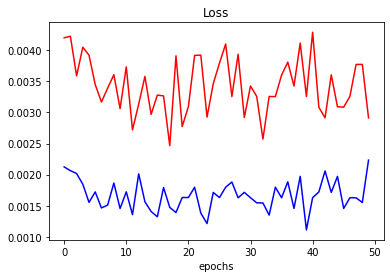

In [67]:
plt.plot(np.arange(epochs), train_loss, 'b')
plt.plot(np.arange(epochs), test_loss, 'r')
plt.title("Loss")
plt.xlabel("epochs")

Text(0.5, 0, 'epochs')

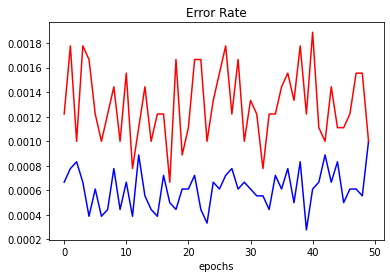

In [68]:
plt.plot(np.arange(epochs), train_err, 'b')
plt.plot(np.arange(epochs), test_err, 'r')
plt.title("Error Rate")
plt.xlabel("epochs")